In [1]:
import json
import glob
import numpy as np
import matplotlib.pyplot as plt

from collections import defaultdict

%matplotlib inline

import keras
from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.layers.noise import GaussianNoise
from keras import backend as K

from IPython import display



In [2]:
LAYER_BLOCKS = 0
LAYER_COINS = 1
LAYER_ENEMIES = 2
NLAYERS = 3

class GameMap:
    def __init__(self):
        self.levels = []
        self.widths = []
        self.heights = []
        self.nmaps = 0
        
        with open("Zelda/zelda.json") as f:
            self.tiledefs = json.load(f)
            #print(self.tiledefs)
        
        for fname in sorted(glob.glob("Zelda/zelda/zelda_lvl*.txt")):
            #print(fname)
            with open(fname) as f:
                data = [line.strip() for line in f.readlines()]
                self.levels.append(data)
                self.heights.append(len(data))
                self.widths.append(len(data[0]))
                self.nmaps += 1

    def getMaps(self, level=0):
        layers = np.ndarray((self.heights[level], self.widths[level], NLAYERS), dtype=np.bool)
        layers.fill(0)
        for r, row in enumerate(self.levels[level]):
            for c, tile in enumerate(row):
                if tile in ('1','2','3'):
                    layers[r,c,LAYER_ENEMIES] = 1
                elif tile in ('+'):
                    layers[r,c,LAYER_COINS] = 1
                elif tile in ('w'):
                    pass
                else:
                    layers[r,c,LAYER_BLOCKS] = 1
                
        return layers[:,:,LAYER_BLOCKS]
    
    def getMapsRange(self, from_level=0, to_level=None):
        if to_level == None:
            to_level = from_level + 1
        return np.concatenate([self.getMaps(i) for i in range(from_level, to_level)], axis=1)
            
    def getMapsRangeWindowed(self, windowsize = 2, from_level=0, to_level=None):
        if to_level == None:
            to_level = from_level + 1
        a = self.getMapsRange(from_level, to_level)
        windows = np.concatenate([np.roll(a,-shift,axis=1) for shift in range(windowsize)])
        return windows
            

In [38]:
gm = GameMap()
a = gm.getMapsRangeWindowed(4,0,5)
at = a.transpose()


#print(json.dumps(gm.tiledefs, indent=2))

(0.0, 80.0)

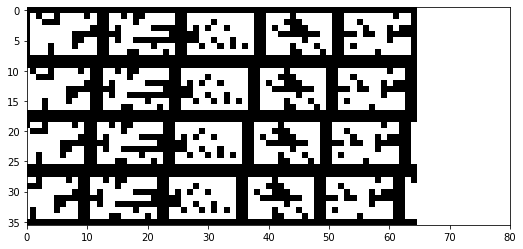

In [40]:
fig, axes = plt.subplots(1,1,figsize=(20,4))
axes.imshow(at.transpose(),cmap="gray", interpolation="nearest")
axes.set_xlim(0,80)

In [42]:
in_out_size = at.shape[1]
hiddensize =2 #int(in_out_size*.25)
model = Sequential()
model.add(Dense(hiddensize, input_shape=(in_out_size,)))
model.add(Activation("sigmoid"))
model.add(Dense(in_out_size))
# leaving off this final relu seems to do a much better job
#model.add(Activation("relu"))
model.add(Activation("sigmoid"))

# "mse" seems to be the best loss function for the problem
# "RMSprop" seems to be the best, with "adadelta" also good
model.compile(loss='mse', optimizer='RMSprop', metrics=['accuracy'])



In [44]:
in_out_size = at.shape[1]
model = Sequential()
model.add(Dense(hiddensize, input_shape=(in_out_size,)))
model.add(Activation("relu"))

model.add(Dense(int(in_out_size/2)))
model.add(Activation("relu"))

model.add(Dense(int(8)))
model.add(Activation("sigmoid"))

model.add(Dense(int(in_out_size/2)))
model.add(Activation("relu"))

model.add(Dense(in_out_size))
# leaving off this final relu seems to do a much better job
#model.add(Activation("relu"))
model.add(GaussianNoise(2))
model.add(Activation("sigmoid"))

# "mse" seems to be the best loss function for the problem
# "RMSprop" seems to be the best, with "adadelta" also good
model.compile(loss='mse', optimizer='RMSprop', metrics=['accuracy'])



In [46]:
in_out_size = at.shape[1]
model = Sequential()
model.add(Dense(hiddensize, input_shape=(in_out_size,)))
model.add(Activation("sigmoid"))

model.add(Dense(int(in_out_size/2)))
model.add(Activation("sigmoid"))

model.add(Dense(int(4)))
model.add(GaussianNoise(5))
model.add(Activation("sigmoid"))

model.add(Dense(int(in_out_size/2)))
model.add(Activation("sigmoid"))

model.add(Dense(in_out_size))
# leaving off this final relu seems to do a much better job
#model.add(Activation("relu"))
model.add(GaussianNoise(1))
model.add(Activation("sigmoid"))

# "mse" seems to be the best loss function for the problem
# "RMSprop" seems to be the best, with "adadelta" also good
model.compile(loss='mse', optimizer='RMSprop', metrics=['accuracy'])




In [48]:
in_out_size = at.shape[1]
dropout = 0
model = Sequential()
model.add(Dense( int(in_out_size*.9), input_shape=(in_out_size,)))
model.add(Activation("relu"))
model.add(Dropout(dropout))

model.add(Dense(int(in_out_size*.8)))
model.add(Activation("relu"))
model.add(Dropout(dropout))


model.add(Dense(int(in_out_size*.5)))
model.add(Activation("relu"))
model.add(Dropout(dropout))

model.add(Dense(int(in_out_size*.8)))
model.add(Activation("relu"))
model.add(Dropout(dropout))


model.add(Dense(int(in_out_size*.9)))
model.add(Activation("relu"))
model.add(Dropout(dropout))

model.add(Dense(in_out_size))

# leaving off this final relu seems to do a much better job.  I think you don't want
# your final activation to be something with hard cutoffs.
#model.add(Activation("relu"))
model.add(Activation("sigmoid"))

# "mse" seems to be the best loss function for the problem
# "RMSprop" seems to be the best, with "adadelta" also good
model.compile(loss='mse', optimizer='RMSprop', metrics=['accuracy'])



In [ ]:
in_out_size = at.shape[1]
dropout = 0
model = Sequential()
model.add(Dense( int(in_out_size*1.5), input_shape=(in_out_size,)))
model.add(Activation("relu"))

model.add(Dense(int(in_out_size*.8)))
model.add(Activation("relu"))

model.add(Dense(int(in_out_size*.5)))
model.add(Activation("relu"))

model.add(Dense(int(in_out_size*.25)))
model.add(Activation("relu"))

model.add(Dense(int(8)))
model.add(Activation("relu"))

model.add(Dense(int(4)))
model.add(Activation("relu"))

model.add(Dense(int(2)))
model.add(Activation("relu"))

model.add(Dense(int(4)))
model.add(Activation("relu"))


model.add(Dense(int(8)))
model.add(Activation("relu"))


model.add(Dense(int(in_out_size*.5)))
model.add(Activation("relu"))

model.add(Dense(int(in_out_size*.8)))
model.add(Activation("relu"))

model.add(Dense(int(in_out_size*1.5)))
model.add(Activation("relu"))

model.add(Dense(in_out_size))

# leaving off this final relu seems to do a much better job.  I think you don't want
# your final activation to be something with hard cutoffs.
#model.add(Activation("relu"))
model.add(Activation("sigmoid"))

# "mse" seems to be the best loss function for the problem
# "RMSprop" seems to be the best, with "adadelta" also good
model.compile(loss='mse', optimizer='adadelta', metrics=['accuracy'])



In [35]:
model.layers

In [36]:
get_hidden_layer_output = K.function([model.layers[0].input],
                                  [model.layers[1].output])
test_a = gm.getMapsRangeWindowed(4, 0, 1)
test_at = test_a.transpose()

hidden_layer_output = get_hidden_layer_output([test_at])[0]



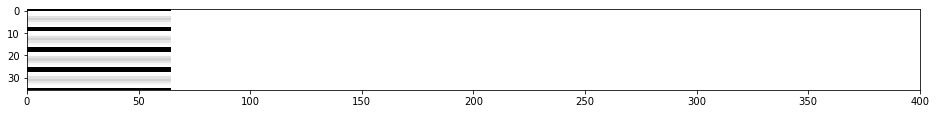

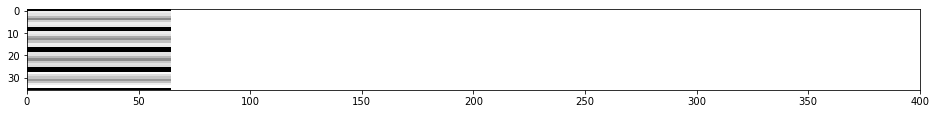

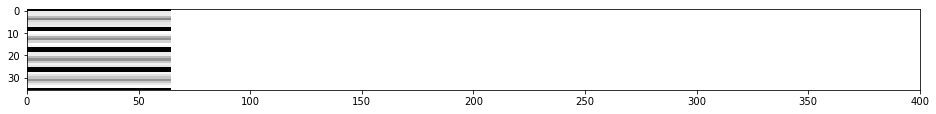

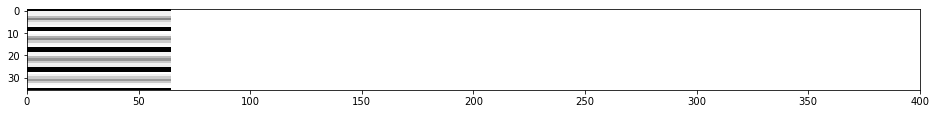

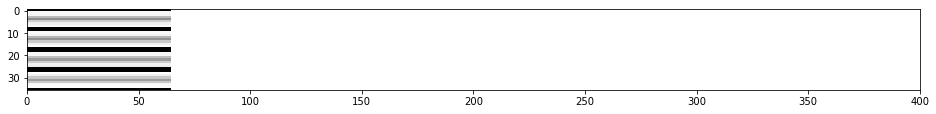

...

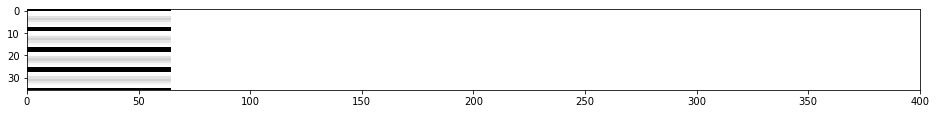

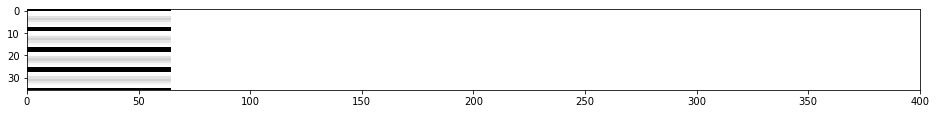

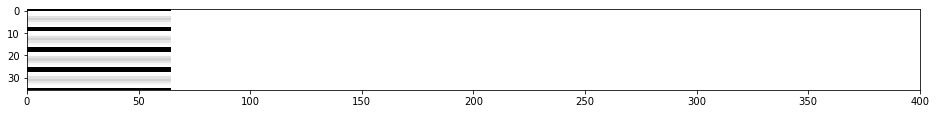

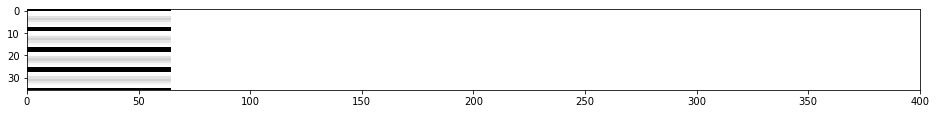

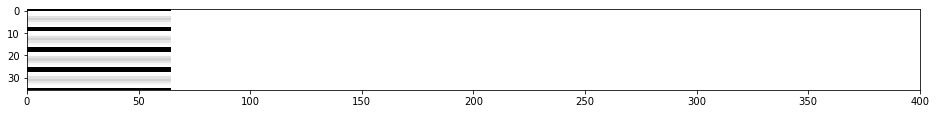

In [37]:
for i in range(500):
    history = model.fit(at, at, epochs=50, batch_size=64, shuffle=True, verbose=False)
    pt = model.predict(at)
    p = pt.transpose()
    fig, axes = plt.subplots(1,1,figsize=(16,4))
    axes.imshow(p,cmap="gray", interpolation="nearest");
    axes.set_xlim(0,400)
    display.clear_output(wait=True)
    display.display(plt.gcf());
    #print(history.history['acc'][-1])
    #axes[1].imshow(a,cmap="gray", interpolation="nearest")

109.36354

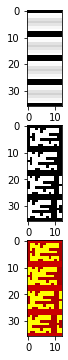

In [39]:
test_a = gm.getMapsRangeWindowed(4, 1)
test_at = test_a.transpose()
test_pt = model.predict(test_at)
test_p = test_pt.transpose()
fig, axes = plt.subplots(3,figsize=(16,6))
axes[0].imshow(test_p,cmap="gray", interpolation="nearest")
axes[1].imshow(test_a,cmap="gray", interpolation="nearest")
axes[2].imshow(test_a-test_p, interpolation="nearest", cmap="hot", vmin=-1, vmax=1)
np.sum(pow(test_a-test_p,2))

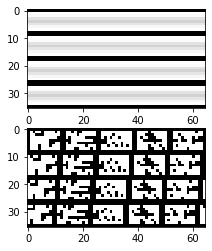

In [41]:
pt = model.predict(at)
p = pt.transpose()
fig, axes = plt.subplots(2,1,figsize=(16,4))
axes[0].imshow(p,cmap="gray", interpolation="nearest")
axes[1].imshow(a,cmap="gray", interpolation="nearest")

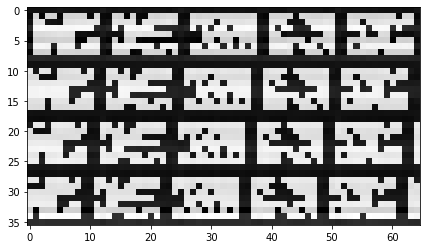

In [43]:
pt = model.predict(at)
p = pt.transpose()
fig, axes = plt.subplots(1,1,figsize=(16,4))
axes.imshow(a-p,cmap="gray", interpolation="nearest")


(0.0, 200.0)

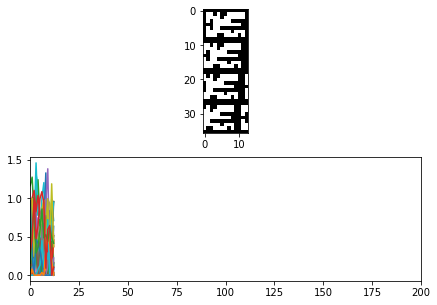

In [45]:
fig, axes = plt.subplots(2,figsize=(7,5))
axes[0].imshow(test_a,cmap="gray", interpolation="nearest")
axes[1].plot(hidden_layer_output[:])
axes[1].set_xlim(0,200)
#axes[1].scatter(hidd en_layer_output[:,0], hidden_layer_output[:,1])
#axes[1].imshow(hidden_layer_output.transpose(),cmap="gray", interpolation="nearest")

In [47]:
model.layers

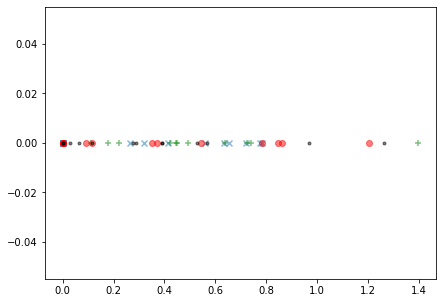

In [59]:
fig, axes = plt.subplots(1,figsize=(7,5))

get_hidden_layer_output = K.function([model.layers[0].input,  K.learning_phase()], [model.layers[3].output])
xd = 0
yd = 1

if True:
    test_a = gm.getMapsRangeWindowed(4, 0)
    test_at = test_a.transpose()
    hidden_layer_output_A = get_hidden_layer_output([test_at,0])[0]
    plt.scatter(hidden_layer_output_A[:,xd], hidden_layer_output_A[:,yd], alpha=.5, marker='x')

if True:
    test_a = gm.getMapsRangeWindowed(4, 1)
    test_at = test_a.transpose()
    hidden_layer_output_B = get_hidden_layer_output([test_at,0])[0]
    plt.scatter(hidden_layer_output_B[:,xd], hidden_layer_output_B[:,yd], color="green", alpha=.5, marker="+")

if True:
    test_a = gm.getMapsRangeWindowed(4, 2)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at,0])[0]
    plt.scatter(hidden_layer_output[:,xd], hidden_layer_output[:,yd], color="red", alpha=.5, marker="o")

if True:
    test_a = gm.getMapsRangeWindowed(4, 4)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at,0])[0]
    plt.scatter(hidden_layer_output[:,xd], hidden_layer_output[:,yd], color="black", alpha=.5, marker=".")



In [60]:
hidden_layer_output_A

array([[7.74984598e-01, 0.00000000e+00, 3.78054798e-01, 4.78966922e-01,
        0.00000000e+00, 0.00000000e+00, 3.58309448e-01, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        1.26496628e-01, 0.00000000e+00, 0.00000000e+00, 1.20344460e-02,
        5.25012732e-01, 0.00000000e+00, 1.34871468e-01, 1.40170798e-01,
        5.93143284e-01, 4.33879733e-01, 1.16574454e+00, 2.39053264e-01,
        1.87678069e-01, 3.90318334e-01, 1.24460608e-02, 0.00000000e+00,
        0.00000000e+00, 5.58471680e-01, 0.00000000e+00, 1.08490691e-01,
        3.36071253e-01, 4.68065232e-01, 2.73316652e-02, 0.00000000e+00,
        6.65743172e-01, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00,
        0.00000000e+00, 0.00000000e+00, 6.65761232e-02, 7.12678254e-01,
        5.50469637e-01, 1.21166080e-01, 0.00000000e+00, 0.00000000e+00,
        1.14487126e-01, 0.00000000e+00, 9.72637415e-01, 0.00000000e+00,
        1.52800679e-01, 3.07902664e-01],
       [0.00000000e+00,

In [154]:
model.layers

In [61]:
# make some fake input!
h = np.ndarray(shape=(150,2))
h[:,0] = np.random.normal(loc=hidden_layer_output_B[8,0], scale=2, size=150)
h[:,1] = np.random.normal(loc=hidden_layer_output_B[8,1], scale=2, size=150)
#h[:,0].fill(hidden_layer_output_B[8,0])
#h[:,1].fill(hidden_layer_output_B[8,1])
hidden_layer_output_B[8,0], hidden_layer_output_B[8,1]

(0.45121777, 0.0)

In [62]:
inject_fake_hidden = K.function([model.layers[5].input],
                                [model.layers[-1].output])

#X = inject_fake_hidden([hidden_layer_output])[0].transpose()
X = inject_fake_hidden([h])[0].transpose()

#th = 0.1
#X[ X <= th] = 0
#X[ X > th] = 1

plt.imshow(X[:14,:], cmap="gray", interpolation="nearest")

Note that input tensors are instantiated via `tensor = tf.keras.Input(shape)`.
The tensor that caused the issue was: dense_113/BiasAdd:0


ValueError: Graph disconnected: cannot obtain value for tensor Tensor("dense_111_input:0", shape=(None, 36), dtype=float32) at layer "dense_111". The following previous layers were accessed without issue: []

In [ ]:
fig, axes = plt.subplots(1,figsize=(7,5))
inject_fake_hidden = K.function([model.layers[5].input],
                                [model.layers[-1].output])

inject_fake_hidden([hidden_layer_output])

if True:
    test_a = gm.getMapsRangeWindowed(4, 0, 1)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], alpha=1)

if True:
    test_a = gm.getMapsRangeWindowed(4, 1, 2)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="green", alpha=1)

if True:
    test_a = gm.getMapsRangeWindowed(4, 2, 3)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="red", alpha=1)

if False:
    test_a = gm.getMapsRangeWindowed(4, 3, 4)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="orange", alpha=.5)



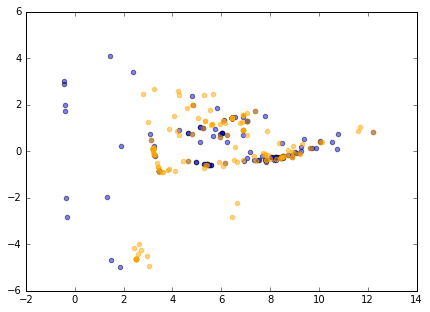

In [149]:
fig, axes = plt.subplots(1,figsize=(7,5))

get_hidden_layer_output = K.function([model.layers[0].input],
                                  [model.layers[4].output])

test_a = gm.getMapsRangeWindowed(4, 2, 3)
test_at = test_a.transpose()
hidden_layer_output = get_hidden_layer_output([test_at])[0]
plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], alpha=.5)

if False:
    test_a = gm.getMapsRangeWindowed(4, 1, 2)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="green", alpha=.5)

if False:
    test_a = gm.getMapsRangeWindowed(4, 2, 3)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="red", alpha=.5)


test_a = gm.getMapsRangeWindowed(4, 5, 6)
test_at = test_a.transpose()
hidden_layer_output = get_hidden_layer_output([test_at])[0]
plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="orange", alpha=.5)



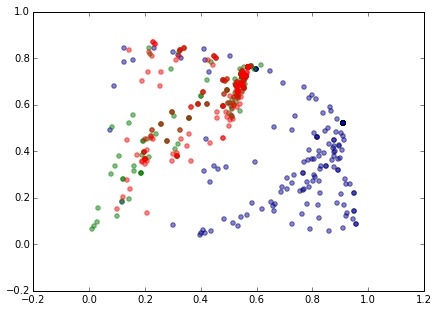

In [17]:
fig, axes = plt.subplots(1,figsize=(7,5))

get_hidden_layer_output = K.function([model.layers[0].input],
                                  [model.layers[1].output])

if True:
    test_a = gm.getMapsRangeWindowed(4, 1, 2)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], alpha=.5)

if True:
    test_a = gm.getMapsRangeWindowed(4, 0, 1)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="green", alpha=.5)

if True:
    test_a = gm.getMapsRangeWindowed(4, 3, 4)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="red", alpha=.5)

if False:
    test_a = gm.getMapsRangeWindowed(4, 7, 8)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="orange", alpha=.5)



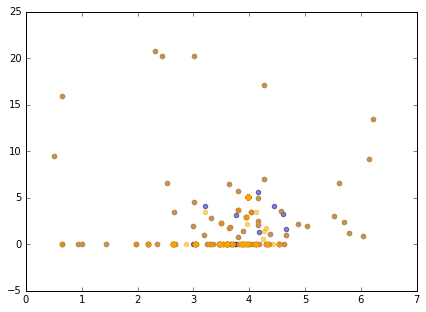

In [134]:
fig, axes = plt.subplots(1,figsize=(7,5))

get_hidden_layer_output = K.function([model.layers[0].input],
                                  [model.layers[1].output])

test_a = gm.getMapsRangeWindowed(4, 2, 3)
test_at = test_a.transpose()
hidden_layer_output = get_hidden_layer_output([test_at])[0]
plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], alpha=.5)

if False:
    test_a = gm.getMapsRangeWindowed(4, 1, 2)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="green", alpha=.5)

if False:
    test_a = gm.getMapsRangeWindowed(4, 2, 3)
    test_at = test_a.transpose()
    hidden_layer_output = get_hidden_layer_output([test_at])[0]
    plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="red", alpha=.5)


test_a = gm.getMapsRangeWindowed(4, 9, 10)
test_at = test_a.transpose()
hidden_layer_output = get_hidden_layer_output([test_at])[0]
plt.scatter(hidden_layer_output[:,0], hidden_layer_output[:,1], color="orange", alpha=.5)



[ 0  1  3  8  9 11 12 13 15]


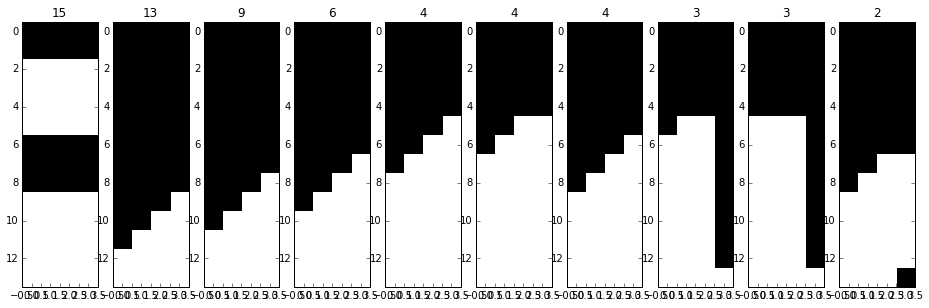

In [236]:
# classify each window
test_a = gm.getMapsRangeWindowed(4, 0, 14)
test_at = test_a.transpose()

d = {}

get_hidden_layer_output = K.function([model.layers[0].input,  K.learning_phase()], [model.layers[6].output])
h = get_hidden_layer_output([test_at,0])[0]
h[ h < .5] = 0
h[ h >= .5] = 1
h[:,0] *= 8
h[:,1] *= 4
h[:,2] *= 2
classes = h.sum(axis=1, dtype="int")
print(np.unique(classes))

for i, c in enumerate(classes):            
    key = tuple(test_at[i])
    if not d.has_key(c):
        d[c] = defaultdict(int)        
    d[c][key] += 1
    



In [275]:
def displayclass(d, class_id, nshow=10):
    fig, axes = plt.subplots(1, nshow,figsize=(8,2))
    i =0
    bin_class = bin(class_id)[2:]
    bin_class = "0"*(4-len(bin_class))+bin_class
    axes[i].set_ylabel("%d = %0.4s" % (class_id, bin_class))
    for key, value in sorted(d[class_id].items(), key=lambda kv: kv[1], reverse=True):
        axes[i].imshow(np.reshape(key, (4,14)).transpose(), cmap="gray", interpolation="nearest")
        axes[i].set_title(value)

        axes[i].get_xaxis().set_visible(False)
        axes[i].get_yaxis().set_ticks([])
        i += 1
        if i == nshow:
            break

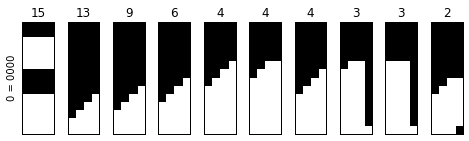

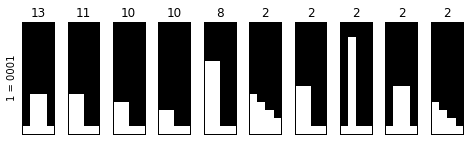

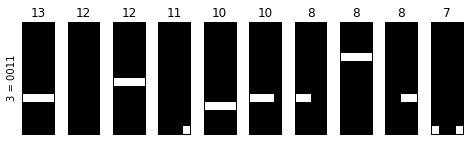

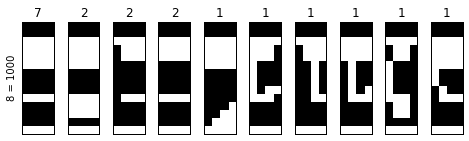

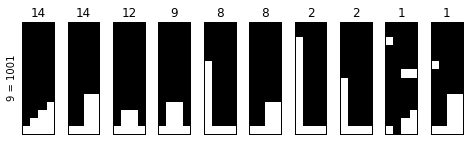

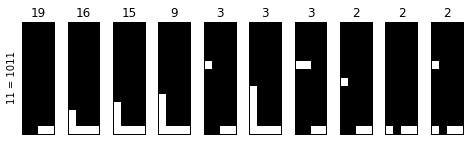

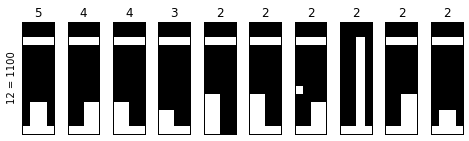

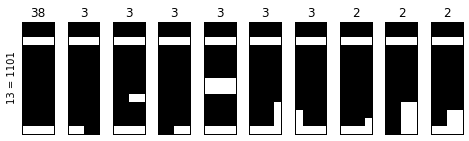

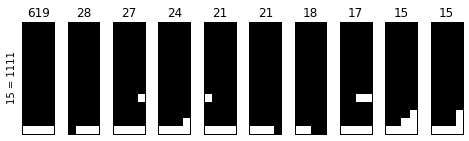

In [276]:
for key in d.iterkeys():
    displayclass(d, key)

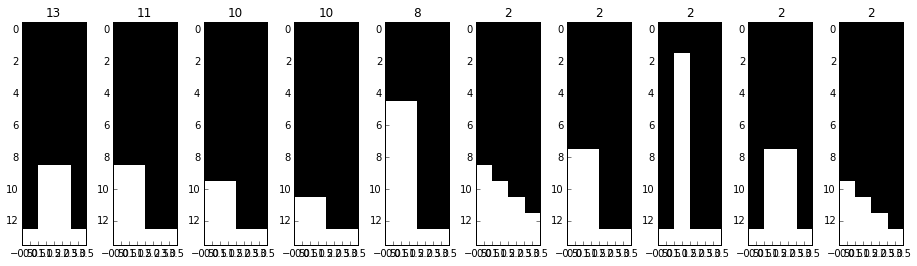

In [243]:
displayclass(d,1)

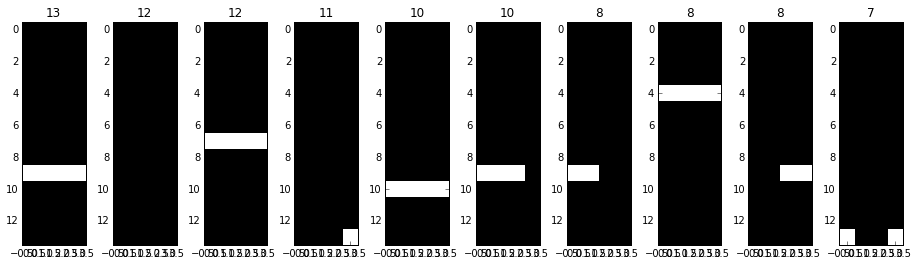

In [244]:
displayclass(d, 3)

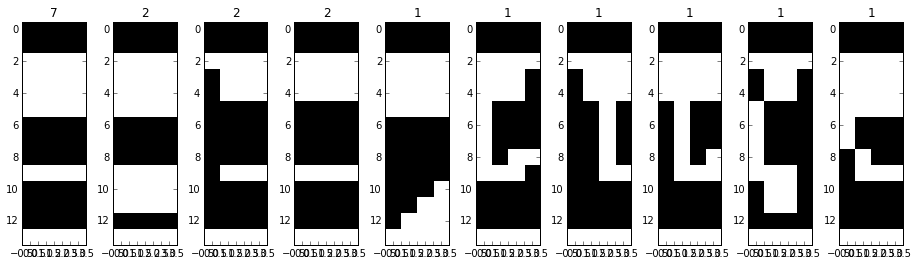

In [245]:
displayclass(d, 8)

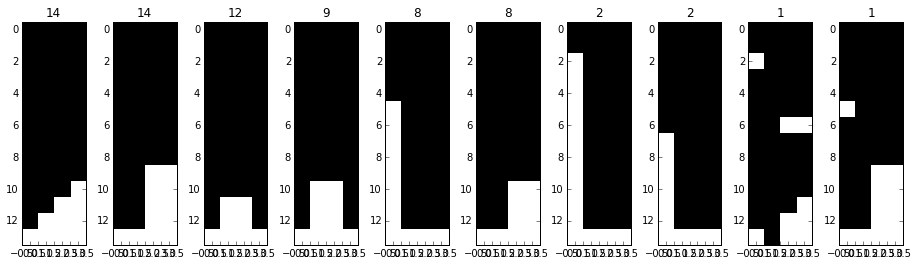

In [246]:
displayclass(d, 9)

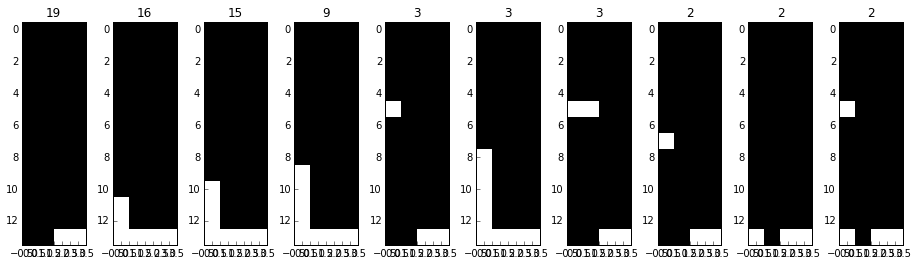

In [247]:
displayclass(d, 11)

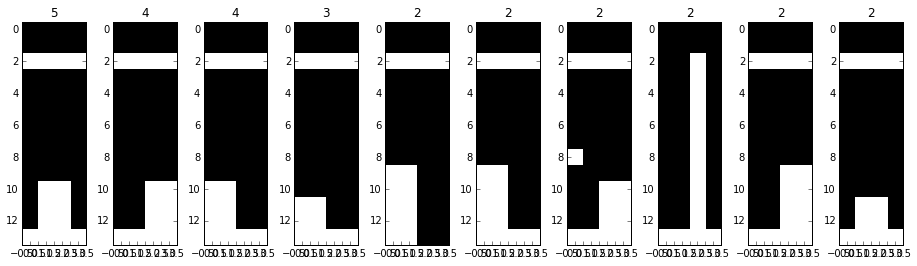

In [248]:
displayclass(d, 12)

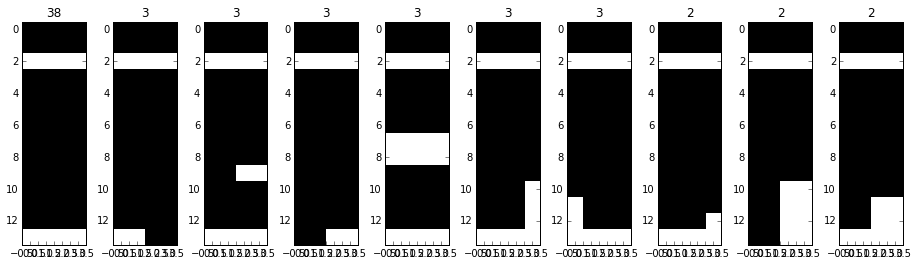

In [249]:
displayclass(d, 13)

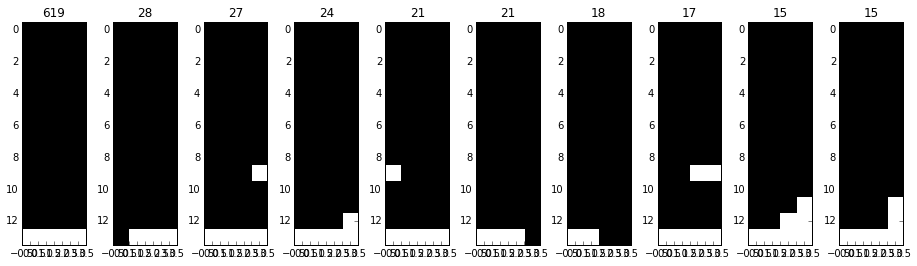

In [250]:
displayclass(d, 15)

In [173]:
model.layers